In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import sys
data_path = "../../../TabulaSapiensData/"
ts_path = "../"
sys.path.append(ts_path)


In [3]:
import matplotlib.pyplot as plt

%matplotlib inline

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


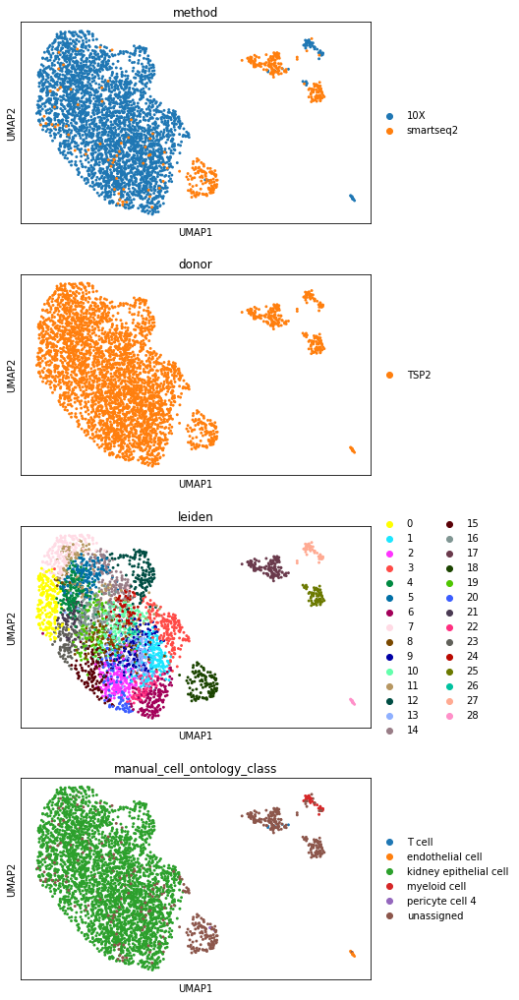

In [5]:
organ = "Kidney"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

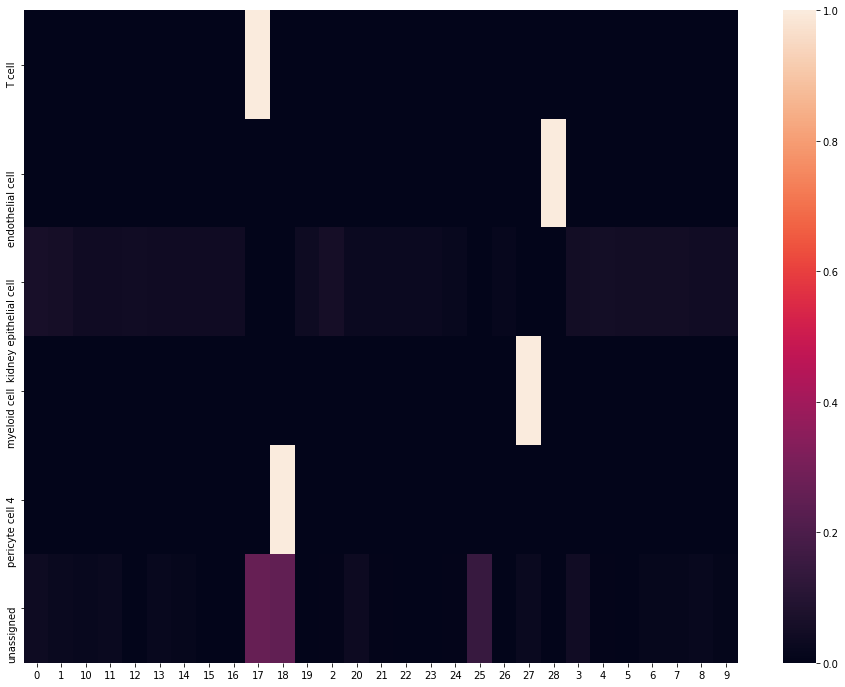

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.sum(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['kidney epithelial cell: 0.92', 'unassigned: 0.08']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-1-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


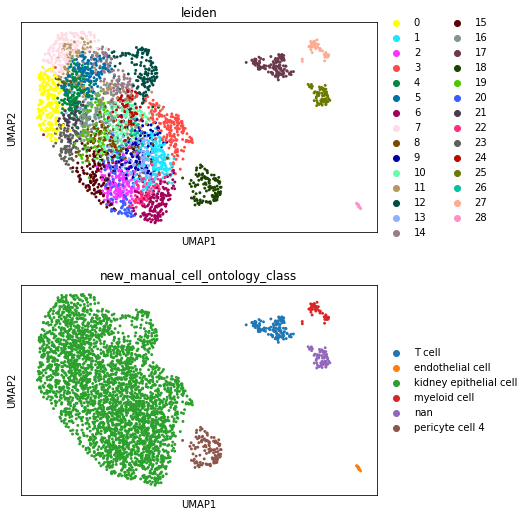

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

In [14]:
organ_adata.obs.groupby(["leiden"]).agg(
    {"new_manual_cell_ontology_class": set, "Propagated.Annotation": set}
)

,new_manual_cell_ontology_class,Propagated.Annotation
leiden,,
0,{kidney epithelial cell},{kidney epithelial cell}
1,{kidney epithelial cell},{kidney epithelial cell}
2,{kidney epithelial cell},{kidney epithelial cell}
3,{kidney epithelial cell},{kidney epithelial cell}
4,{kidney epithelial cell},{kidney epithelial cell}
5,{kidney epithelial cell},{kidney epithelial cell}
6,{kidney epithelial cell},{kidney epithelial cell}
7,{kidney epithelial cell},{kidney epithelial cell}
8,{kidney epithelial cell},{kidney epithelial cell}


/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


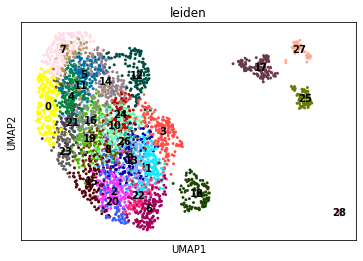

In [15]:
sc.pl.umap(organ_adata, color="leiden", legend_loc="on data")

# Sankey Diagram between cluster and compartment

In [16]:
from utils.colorDict import (
    donor_colors,
    method_colors,
    compartment_colors,
    tissue_colors,
)

In [17]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [18]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Kidney.html'

# visualize compartment markers

In [19]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [20]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



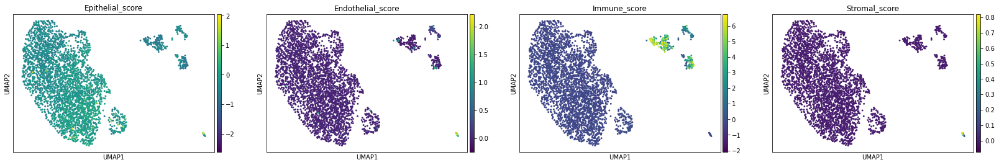

In [21]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [22]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [23]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [24]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [25]:
organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
organ_cluster_genes.iloc[:20]


,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,PCK1,SPP1,APOE,SPP1,SMIM32,FABP3,PCK1,ACSL1,LRP2,CD24,...,ATP5MC1,APOE,CYS1,CLU,FABP1,MGST1,CD74,AGMAT,LYZ,EFNB2
1,FABP1,ITM2B,MGST1,LGMN,GBA3,CHCHD10,FABP1,HIPK3,PIGR,MMP7,...,SNHG29,TMEM176B,SMIM32,APOE,FTL,SNHG16,MALAT1,LGMN,C1orf162,FAM107A
2,ALDOB,APOE,CD63,KCNJ16,NDUFA5,TPM3,SPP1,HIPK2,SLC16A9,TSPAN1,...,NUDT8,CD63,WDFY3-AS2,SLC3A1,SAT2,FABP3,HNRNPH1,ASS1,NEAT1,ADGRF5
3,RNF152,NAT8,EPCAM,CLTRN,FBP1,DSTN,SLC16A9,SNX30,ATP1A1,TMEM176B,...,C1QBP,MGST1,HOXD-AS2,LAMP2,ALDOB,RAN,RPS19,PSAT1,FCER1G,MGP
4,ALDH6A1,ATP1B1,ITM2B,AQP1,MRPS36,SERBP1,GPX3,TRIM44,SLC4A4,AQP1,...,CYC1,NAT8,SELENOW,SPP1,HPD,SNHG29,MT-CYB,GATM,TYROBP,SLCO2A1
5,ACO1,LAPTM4A,SPP1,SLC13A3,ATP5MC3,OPTN,SLC27A2,HIF1A,KCNJ15,CD81,...,EIF3K,TMEM176A,MAP1LC3A,PCSK1N,PCK1,LAD1,MS4A1,ATP1B1,CTSS,PODXL
6,PAH,TMBIM6,TMEM176A,TMED5,FAM107B,TPM1,SMIM24,NDUFS1,CUBN,IGFBP7,...,SNHG16,ITM2B,FAM107B,NAT8,CTXN3,NME1,TXNIP,MGST1,AIF1,HSPG2
7,MAOA,TMEM59,TSPAN1,TSPAN3,PPP1R16A,TCEAL9,SLC22A6,ACO1,ANPEP,NAT8,...,NME1,CXCL14,LINC01320,TMEM176B,AP1M2,ALDH1B1,STK17B,AIFM1,HCLS1,TCIM
8,HPD,CD164,PDZK1IP1,ATP1B1,ACAA1,NPM1,APOE,ARHGAP5,CDH6,CD151,...,CHCHD10,NPC2,PLCL2,ITM2B,CAMK2N1,TUBA1B,HLA-B,TMED2,EVI2B,TIMP2
9,GSTA1,TSPAN1,TMEM176B,LAMP1,DHRS4L2,S100A11,CLU,CPEB4,SLC3A1,SPINT2,...,UQCC2,CYBA,BHMT,ATP1B1,GPX4,COMTD1,MT-CO3,ALDH1B1,FOS,APP


In [26]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
PCK1,14.633536,2.548445,5.051929e-44
FABP1,13.152105,2.825792,2.435778e-35
ALDOB,12.936282,2.420628,2.756069e-34
RNF152,10.716472,1.259923,3.134509e-23
ALDH6A1,10.243294,1.223989,2.765643e-21
ACO1,10.041734,1.112321,1.897178e-20
PAH,10.016696,1.417132,2.368319e-20
MAOA,9.870025,1.165230,9.444596e-20
HPD,8.981347,1.267986,2.280308e-16
GSTA1,8.846776,1.213019,6.977953e-16


1


,wilcoxon_score,log fold change,adjusted pvalue
SPP1,17.299730,2.943013,2.782208e-62
ITM2B,16.771992,2.347160,1.151409e-58
APOE,16.416784,2.326926,2.846414e-56
NAT8,16.371338,2.245610,4.509545e-56
ATP1B1,16.314074,2.034313,9.229100e-56
LAPTM4A,16.161472,1.952786,9.250748e-55
TMBIM6,15.970757,1.995407,1.718113e-53
TMEM59,15.902455,1.942387,4.483608e-53
CD164,15.745150,1.831401,4.741591e-52
TSPAN1,15.739594,2.290823,4.741591e-52


2


,wilcoxon_score,log fold change,adjusted pvalue
APOE,14.561059,2.049423,2.924769e-43
MGST1,14.442266,1.759021,8.255612e-43
CD63,14.246634,1.868849,9.231094e-42
EPCAM,13.813605,1.871874,2.538723e-39
ITM2B,13.812045,1.946177,2.538723e-39
SPP1,13.648861,2.262372,2.011975e-38
TMEM176A,13.517323,1.655812,1.039395e-37
TSPAN1,13.474607,1.943216,1.623765e-37
PDZK1IP1,13.380804,1.469433,5.121408e-37
TMEM176B,13.142531,1.621156,1.105788e-35


3


,wilcoxon_score,log fold change,adjusted pvalue
SPP1,9.740647,1.570613,1.294251e-19
LGMN,9.538005,1.493408,8.571829e-19
KCNJ16,9.473441,1.267411,1.562788e-18
CLTRN,9.399812,1.139313,3.064640e-18
AQP1,9.166417,1.291051,2.617041e-17
SLC13A3,8.915276,1.199814,2.387205e-16
TMED5,8.806304,1.138990,6.140500e-16
TSPAN3,8.570997,1.033618,4.610403e-15
ATP1B1,8.527011,1.079053,6.597721e-15
LAMP1,8.514159,1.153988,7.263645e-15


4


,wilcoxon_score,log fold change,adjusted pvalue
SMIM32,9.226544,1.157787,1.828260e-16
GBA3,7.994086,0.818621,3.659428e-12
NDUFA5,7.682199,0.697498,3.835887e-11
FBP1,7.592939,0.762034,6.818679e-11
MRPS36,7.456740,0.763865,1.728415e-10
ATP5MC3,7.454374,0.732509,1.728415e-10
FAM107B,7.453327,0.901886,1.728415e-10
PPP1R16A,7.407320,0.840720,2.299102e-10
ACAA1,7.380553,0.761037,2.729377e-10
DHRS4L2,7.366510,0.867224,2.946064e-10


5


,wilcoxon_score,log fold change,adjusted pvalue
FABP3,10.152248,1.310561,2.723299e-20
CHCHD10,9.284853,1.017180,9.532845e-17
TPM3,9.039976,0.766596,7.096401e-16
DSTN,8.894872,0.904372,2.295404e-15
SERBP1,8.882290,0.837875,2.409921e-15
OPTN,8.870514,0.920199,2.521347e-15
TPM1,8.815585,1.031956,3.689020e-15
TCEAL9,8.572241,1.012986,2.987382e-14
NPM1,8.545825,0.638275,3.577647e-14
S100A11,8.528201,0.949555,3.977489e-14


6


,wilcoxon_score,log fold change,adjusted pvalue
PCK1,13.836811,2.781546,8.997597e-39
FABP1,13.744208,3.373930,1.624024e-38
SPP1,13.132644,2.460054,4.200404e-35
SLC16A9,12.847433,2.169173,1.046853e-33
GPX3,12.788610,1.995001,1.862623e-33
SLC27A2,12.334377,2.011755,4.974068e-31
SMIM24,12.263337,1.796528,9.457562e-31
SLC22A6,12.262164,2.294307,9.457562e-31
APOE,12.078011,1.897445,8.125140e-30
CLU,11.993378,2.215222,2.059822e-29


7


,wilcoxon_score,log fold change,adjusted pvalue
ACSL1,10.260407,1.216971,2.843366e-21
HIPK3,9.726170,1.182829,4.734150e-19
HIPK2,8.360504,1.096512,6.449945e-14
SNX30,8.348533,1.062196,6.896408e-14
TRIM44,8.127233,1.196092,3.917561e-13
HIF1A,8.081049,0.981819,5.642051e-13
NDUFS1,7.966807,0.939880,1.369374e-12
ACO1,7.859302,0.904783,3.115110e-12
ARHGAP5,7.736497,0.943117,8.021488e-12
CPEB4,7.547501,0.945598,3.037202e-11


8


,wilcoxon_score,log fold change,adjusted pvalue
LRP2,6.612814,1.031323,1.849895e-07
PIGR,6.067761,1.180549,3.054308e-06
SLC16A9,5.765499,0.931451,1.195031e-05
ATP1A1,5.504767,0.759067,3.991352e-05
SLC4A4,5.441667,0.775888,5.357595e-05
KCNJ15,5.413210,0.841327,6.135766e-05
CUBN,4.832483,0.765696,6.902680e-04
ANPEP,4.758783,0.867487,8.888155e-04
CDH6,4.728635,0.907372,9.948473e-04
SLC3A1,4.659473,0.716383,1.314295e-03


9


,wilcoxon_score,log fold change,adjusted pvalue
CD24,10.965427,1.523565,3.298778e-23
MMP7,10.544013,2.233478,1.593565e-21
TSPAN1,10.170740,1.566736,3.942300e-20
TMEM176B,9.793945,1.310039,1.319457e-18
AQP1,9.782036,1.512048,1.319457e-18
CD81,9.698625,1.402972,2.570009e-18
IGFBP7,9.640124,1.497454,3.982742e-18
NAT8,9.363724,1.337899,5.035011e-17
CD151,9.154086,1.479733,3.227256e-16
SPINT2,8.952122,1.310579,1.866252e-15


10


,wilcoxon_score,log fold change,adjusted pvalue
VIM,10.173086,1.748703,1.539383e-19
CD24,10.039278,1.385202,3.014764e-19
ANXA2,8.394475,1.086990,9.183349e-13
MT1E,7.483233,1.542913,8.538019e-10
S100A6,7.232717,1.213201,4.645089e-09
KRT18,7.071505,0.908767,1.288937e-08
MMP7,6.991490,1.393208,2.001448e-08
MYC,6.916415,1.263695,3.029942e-08
LEPROT,6.868237,0.895920,3.826549e-08
AKAP12,6.710234,1.240331,1.039923e-07


11


,wilcoxon_score,log fold change,adjusted pvalue
BICC1,8.783170,1.043155,9.356256e-14
ZBTB20,8.006857,1.012082,3.463840e-11
CRYZ,7.748540,0.876064,1.824080e-10
EPS8,7.547529,0.925614,6.528610e-10
PPP2R3A,7.299965,1.003342,3.389055e-09
SASH1,7.143755,1.451081,8.516261e-09
AFF1,7.128778,0.940957,8.516261e-09
PJA2,7.091486,0.884052,9.763543e-09
CLIC4,7.058546,0.862732,1.090884e-08
BHMT,7.036913,1.035017,1.090884e-08


12


,wilcoxon_score,log fold change,adjusted pvalue
TYMS,16.904421,4.863911,2.457254e-59
TUBA1B,16.860430,3.592496,2.588726e-59
TUBB,16.735111,3.198297,1.427014e-58
STMN1,16.138519,3.715272,2.013122e-54
TK1,15.796700,4.583841,3.859898e-52
PCNA,15.585235,3.641709,8.999841e-51
DEK,15.416182,2.395456,1.071594e-49
DUT,15.362078,2.449977,2.163470e-49
H2AFZ,15.345608,2.641569,2.479045e-49
PCLAF,15.186283,6.881858,2.566439e-48


13


,wilcoxon_score,log fold change,adjusted pvalue
TSPAN1,8.206096,1.337295,6.725842e-12
RTN4,6.333835,0.893191,5.027959e-07
GPX3,5.957904,0.945290,3.668510e-06
ALDOB,5.850041,1.479148,6.429276e-06
BBOX1,5.750472,0.865017,1.069207e-05
GSTA1,5.655501,0.915664,1.633561e-05
SMIM24,5.516268,0.772474,3.235747e-05
PGRMC1,5.503934,0.753112,3.363815e-05
MAOA,5.440248,0.753167,4.606276e-05
ARG2,5.392719,0.856200,5.754278e-05


14


,wilcoxon_score,log fold change,adjusted pvalue
DCDC2,13.159628,2.381763,8.820063e-35
TPM1,13.027141,1.776531,2.524391e-34
PPFIBP1,11.905581,1.955102,1.303265e-28
SOX4,11.694797,2.370647,1.329593e-27
VIM,11.666864,2.110003,1.583054e-27
ANXA2,11.319167,1.634990,7.761221e-26
ANXA3,10.165076,3.066148,1.519383e-20
S100A6,10.044837,1.944925,4.749229e-20
TUBB,9.321639,1.410647,4.495966e-17
YWHAH,9.286702,1.208921,5.855477e-17


15


,wilcoxon_score,log fold change,adjusted pvalue
AKR1A1,8.384855,0.820001,2.989895e-12
NQO2,7.570941,0.855197,1.090651e-09
SAT2,7.350944,0.840586,3.862112e-09
NDUFB10,7.148019,0.699507,1.295714e-08
NDUFC2,7.017689,0.830122,2.616980e-08
ETFB,6.994229,0.709003,2.616980e-08
LGALS2,6.947527,0.795051,3.126365e-08
HSD17B10,6.922156,0.731319,3.273316e-08
NDUFB11,6.897698,0.779250,3.457111e-08
AKR7A2,6.868156,0.751664,3.828728e-08


16


,wilcoxon_score,log fold change,adjusted pvalue
SNHG29,11.129094,1.262912,4.192230e-24
GAS5,11.088649,1.392595,4.192230e-24
RPL12,10.767905,1.040738,9.575754e-23
RPL28,9.987052,0.969547,2.378202e-19
RPS2,9.972064,0.877486,2.378202e-19
RPS8,9.805371,0.882269,1.047435e-18
RPL14,9.715269,0.891462,2.012888e-18
RPS18,9.709926,0.765208,2.012888e-18
RPL26,9.653840,0.898657,3.097132e-18
RPL10A,9.606877,0.886000,4.402434e-18


17


,wilcoxon_score,log fold change,adjusted pvalue
TMSB4X,18.635492,10.646417,5.076850e-73
MALAT1,18.633324,14.844894,5.076850e-73
B2M,18.488754,8.056012,4.991458e-72
HNRNPH1,18.407263,7.272980,1.690807e-71
RPS27,17.890915,5.103087,6.285985e-68
TMSB4XP8,17.886267,10.759669,6.344672e-68
TMSB4XP4,17.702568,8.287855,1.241267e-66
ARHGDIB,17.688139,12.422027,1.450935e-66
CXCR4,17.612268,12.130021,5.076511e-66
PTPRC,17.274130,10.336841,1.549033e-63


18


,wilcoxon_score,log fold change,adjusted pvalue
GPX3,15.917709,5.703788,1.405648e-52
FTH1P20,15.846052,6.211095,2.937515e-52
FTLP3,15.001899,5.099861,8.400608e-47
FXYD2,14.690772,3.717442,6.212282e-45
FP671120.5,14.204263,4.482502,3.383250e-42
FTL,12.674685,2.765273,5.464594e-34
CRYAB,11.256998,2.526078,3.997979e-27
EEF1A1P5,11.067578,3.383132,2.938684e-26
FTH1P8,10.708007,3.904595,1.171750e-24
FTH1P7,9.803528,3.747012,7.776928e-21


19


,wilcoxon_score,log fold change,adjusted pvalue
ATP5MC1,6.306182,0.763729,0.000017
SNHG29,6.015690,0.798717,0.000035
NUDT8,5.818484,0.878723,0.000064
C1QBP,5.678009,0.626930,0.000101
CYC1,5.486452,0.647867,0.000241
EIF3K,5.416666,0.596212,0.000325
SNHG16,5.374177,0.741153,0.000377
NME1,5.339995,0.727625,0.000421
CHCHD10,5.279087,0.745244,0.000532
UQCC2,5.219032,0.711041,0.000623


20


,wilcoxon_score,log fold change,adjusted pvalue
APOE,11.484156,2.699995,6.248669e-26
TMEM176B,11.458861,2.639714,6.248669e-26
CD63,10.889717,2.593228,2.532194e-23
MGST1,10.682661,2.371233,1.805873e-22
NAT8,10.460608,2.527086,1.542551e-21
TMEM176A,10.177619,2.370216,2.448924e-20
ITM2B,9.586646,2.143724,7.652676e-18
CXCL14,9.526306,1.872962,1.199323e-17
NPC2,9.458244,1.901395,2.048389e-17
CYBA,9.376076,1.863064,4.031064e-17


21


,wilcoxon_score,log fold change,adjusted pvalue
CYS1,4.043030,0.752138,0.011678
SMIM32,3.864185,0.699369,0.020252
WDFY3-AS2,2.863930,0.629403,0.252381
HOXD-AS2,2.842819,0.591811,0.264038
SELENOW,2.569313,0.351211,0.470131
MAP1LC3A,2.488953,0.415301,0.548939
FAM107B,2.360765,0.369721,0.691326
LINC01320,2.272233,0.320163,0.808016
PLCL2,2.253165,0.656134,0.831406
BHMT,2.202089,0.332244,0.908643


22


,wilcoxon_score,log fold change,adjusted pvalue
CLU,9.340590,2.017494,5.639716e-16
APOE,9.153137,1.736111,1.627865e-15
SLC3A1,8.649270,1.632884,1.017077e-13
LAMP2,8.462297,1.497769,3.245734e-13
SPP1,8.456438,1.890074,3.245734e-13
PCSK1N,8.367639,1.348739,5.767710e-13
NAT8,8.259557,1.492793,1.229661e-12
TMEM176B,7.812314,1.277063,4.131747e-11
ITM2B,7.689477,1.478541,9.663698e-11
ATP1B1,7.341100,1.231705,1.221287e-09


23


,wilcoxon_score,log fold change,adjusted pvalue
FABP1,9.234851,2.782272,1.522650e-15
FTL,8.987235,1.090187,7.462586e-15
SAT2,8.942448,1.270917,7.469485e-15
ALDOB,8.706511,2.352627,4.612032e-14
HPD,8.645009,1.617881,6.334522e-14
PCK1,8.575686,2.044103,9.664334e-14
CTXN3,8.330320,1.999103,6.780492e-13
AP1M2,8.269086,1.253200,9.933591e-13
CAMK2N1,7.976254,1.242035,9.866678e-12
GPX4,7.737157,0.776550,5.984995e-11


24


,wilcoxon_score,log fold change,adjusted pvalue
MGST1,8.297802,1.599298,6.243471e-12
SNHG16,7.791647,1.404327,1.946862e-10
FABP3,7.709305,1.629710,2.482437e-10
RAN,7.648557,1.186880,2.829856e-10
SNHG29,7.626963,1.235104,2.829856e-10
LAD1,7.419388,1.683271,1.154470e-09
NME1,7.345173,1.396569,1.728195e-09
ALDH1B1,7.304358,1.376239,2.008764e-09
TUBA1B,7.291247,1.590120,2.008764e-09
COMTD1,7.203804,1.402308,3.447177e-09


25


,wilcoxon_score,log fold change,adjusted pvalue
CD74,13.860749,11.401325,6.447705e-39
MALAT1,13.601649,14.322050,1.152391e-37
HNRNPH1,13.216701,6.625678,5.910541e-36
RPS19,13.016522,5.259490,4.463185e-35
MT-CYB,12.993290,4.424418,4.648118e-35
MS4A1,12.991184,17.819742,4.648118e-35
TXNIP,12.990401,8.008295,4.648118e-35
STK17B,12.948934,9.079242,7.381711e-35
HLA-B,12.835964,7.904233,2.529221e-34
MT-CO3,12.805872,4.148760,3.195998e-34


26


,wilcoxon_score,log fold change,adjusted pvalue
AGMAT,5.683362,1.126205,0.000517
LGMN,5.634427,1.413488,0.000517
ASS1,5.421548,0.802422,0.000935
PSAT1,5.385759,1.138809,0.000935
GATM,5.368552,0.966374,0.000935
ATP1B1,5.272471,1.172466,0.001321
MGST1,5.181277,1.102658,0.001853
AIFM1,5.152852,1.067162,0.001888
TMED2,5.128763,0.991858,0.001908
ALDH1B1,4.916367,0.981964,0.005043


27


,wilcoxon_score,log fold change,adjusted pvalue
LYZ,11.789177,12.668875,1.493770e-27
C1orf162,11.691169,8.145432,2.775274e-27
NEAT1,11.626541,8.003013,3.556833e-27
FCER1G,11.589788,7.335671,4.214234e-27
TYROBP,11.583250,7.827870,4.214234e-27
CTSS,11.538031,8.181808,4.294256e-27
AIF1,11.535347,10.965788,4.294256e-27
HCLS1,11.438509,5.641881,1.053615e-26
EVI2B,11.362732,5.739732,2.096693e-26
FOS,11.309529,6.582162,3.133604e-26


28


,wilcoxon_score,log fold change,adjusted pvalue
EFNB2,6.467034,32.661224,4.238351e-07
FAM107A,6.467034,10.449214,4.238351e-07
ADGRF5,6.467034,35.492519,4.238351e-07
MGP,6.466250,15.710606,4.238351e-07
SLCO2A1,6.466250,14.629266,4.238351e-07
PODXL,6.464944,14.288078,4.238351e-07
HSPG2,6.457365,9.836008,4.238351e-07
TCIM,6.452269,8.506743,4.238351e-07
TIMP2,6.442598,9.138539,4.238351e-07
APP,6.441292,6.384263,4.238351e-07


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



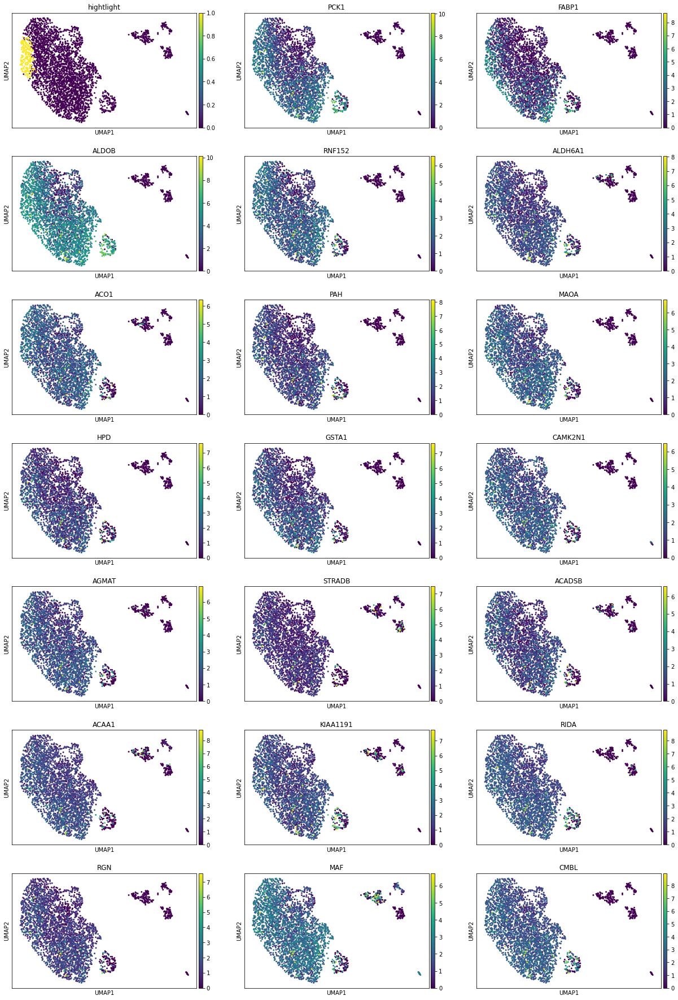

In [27]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


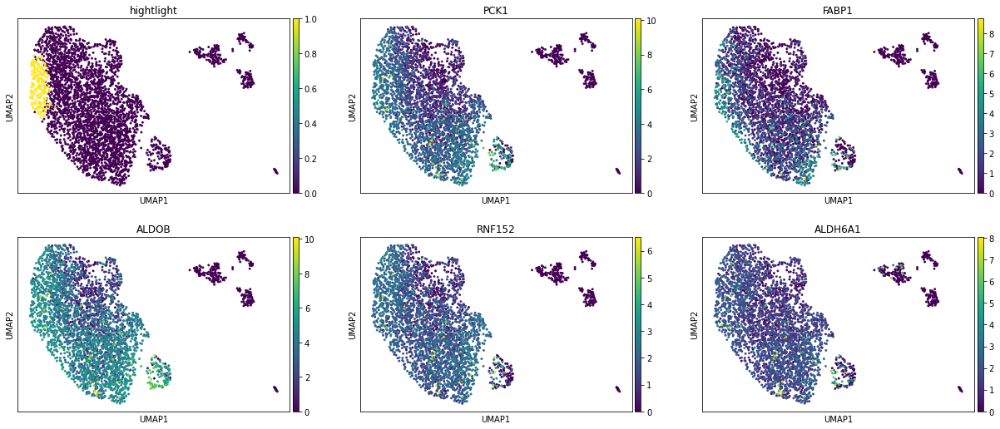

1


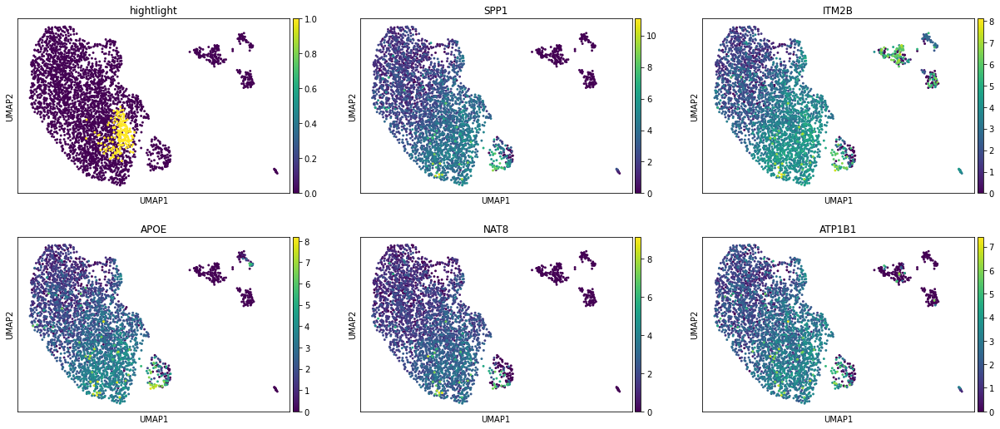

2


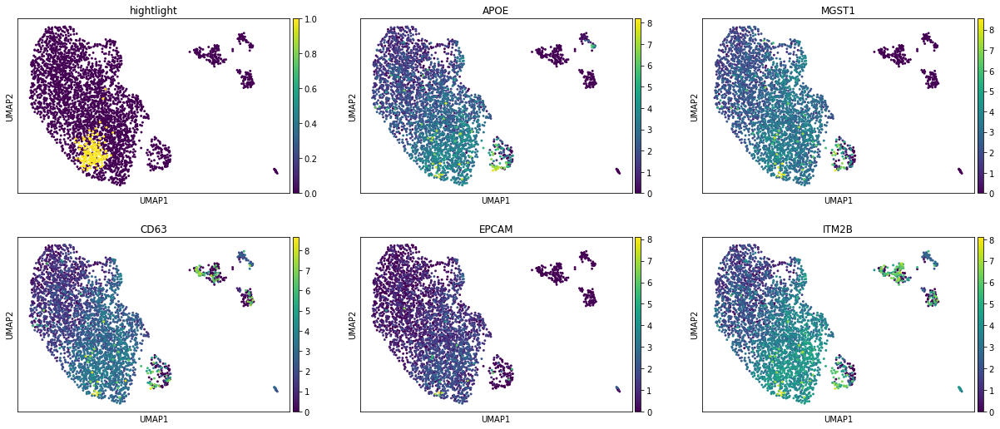

3


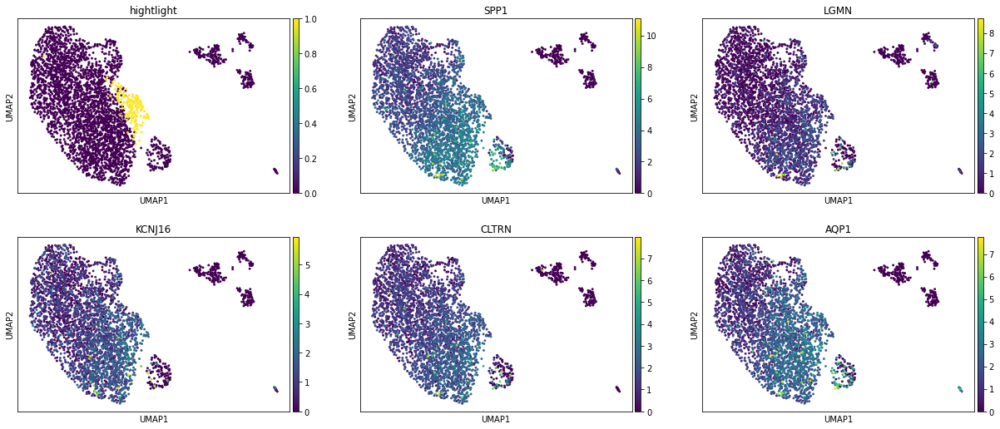

4


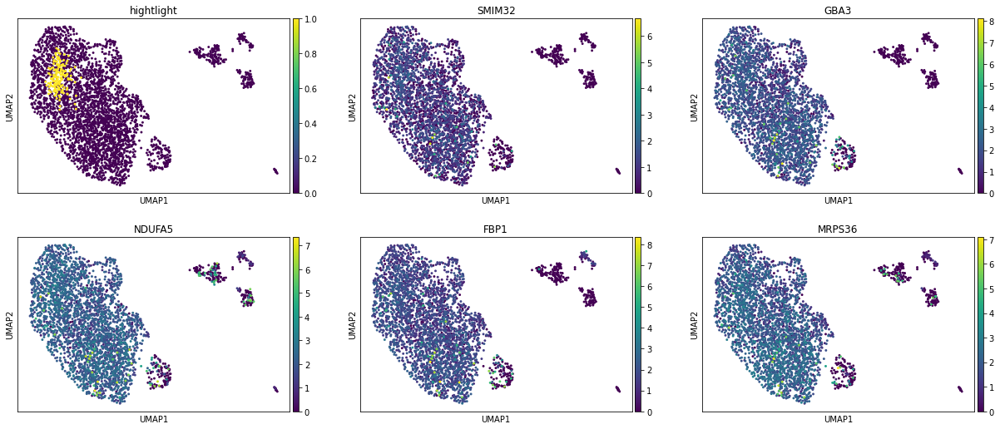

5


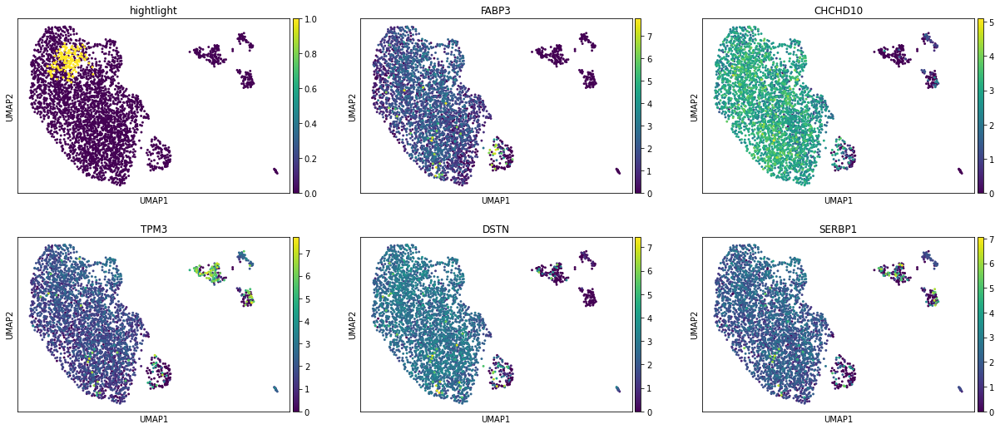

6


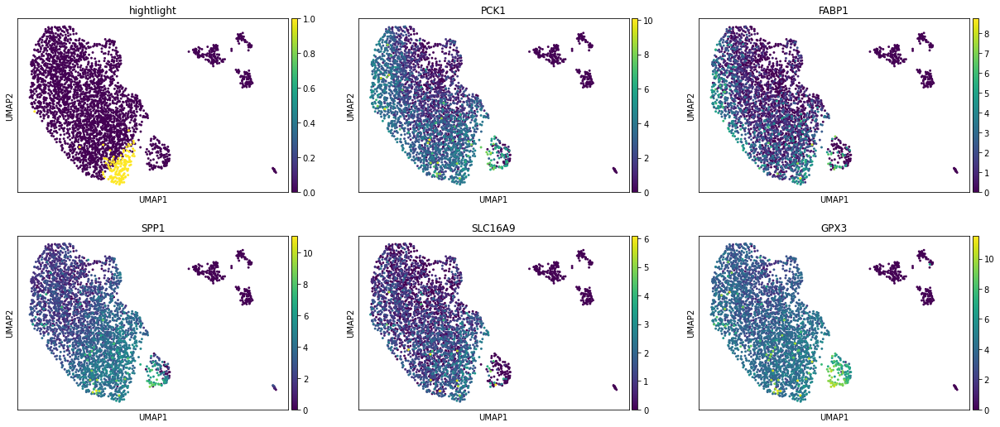

7


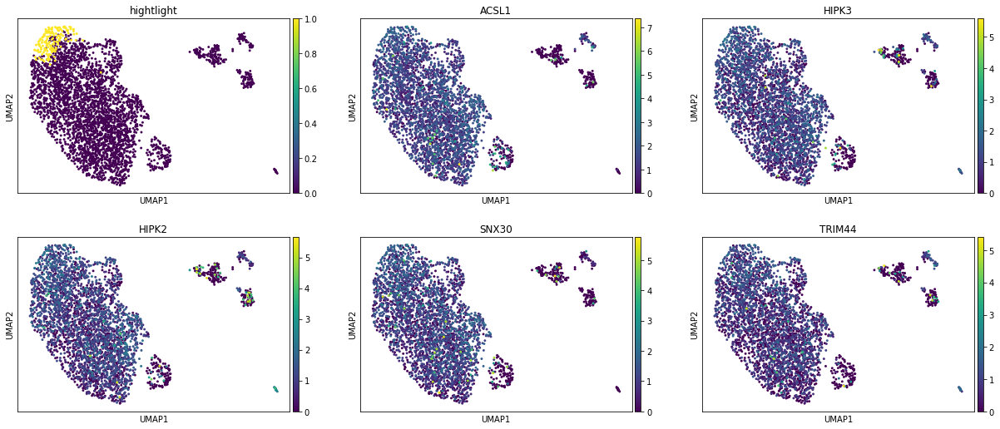

8


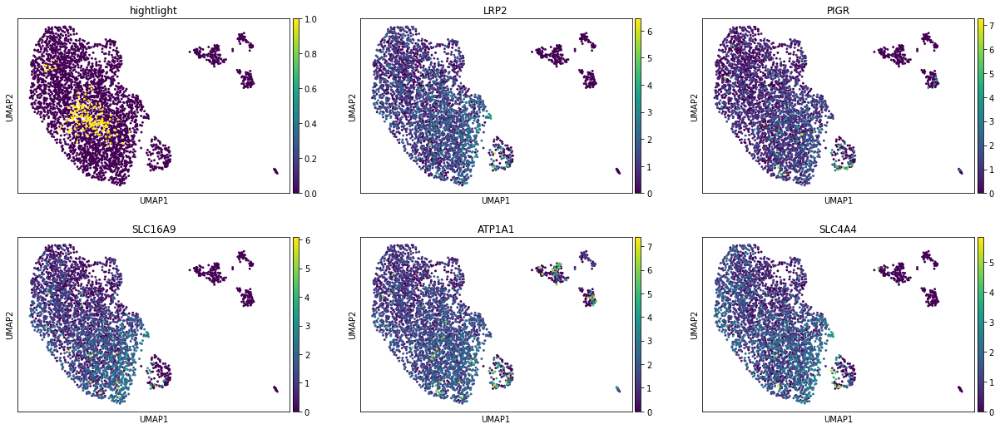

9


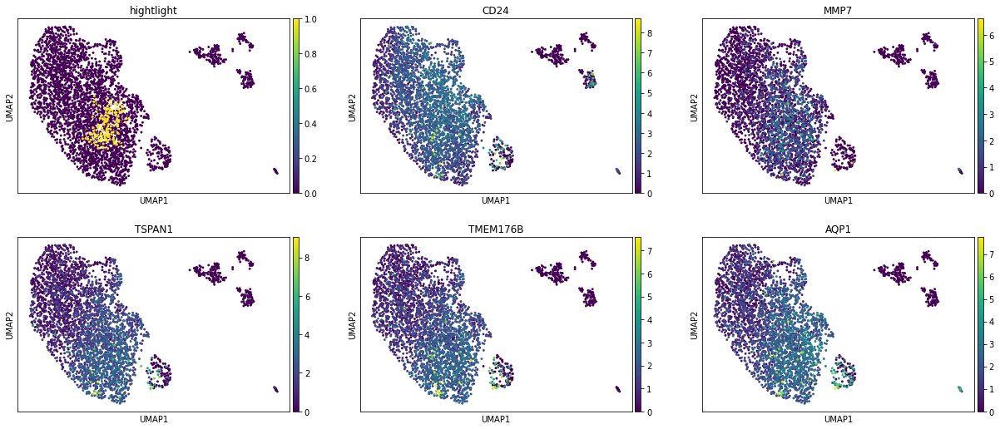

10


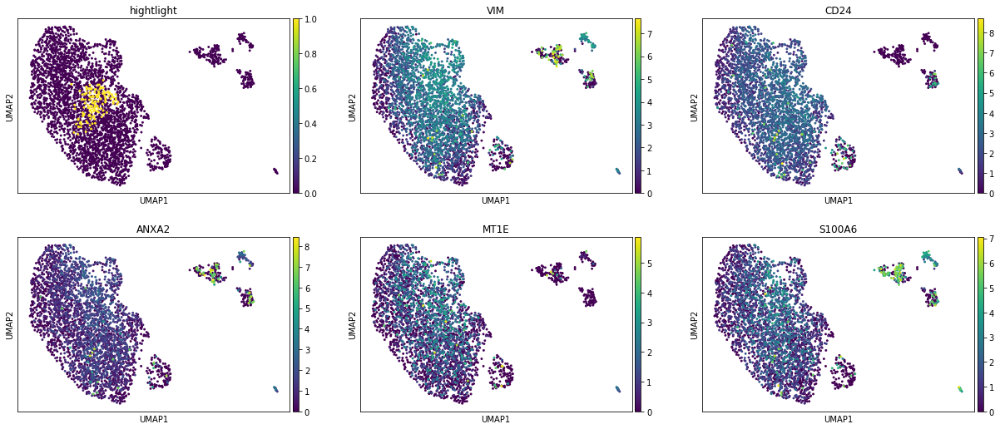

11


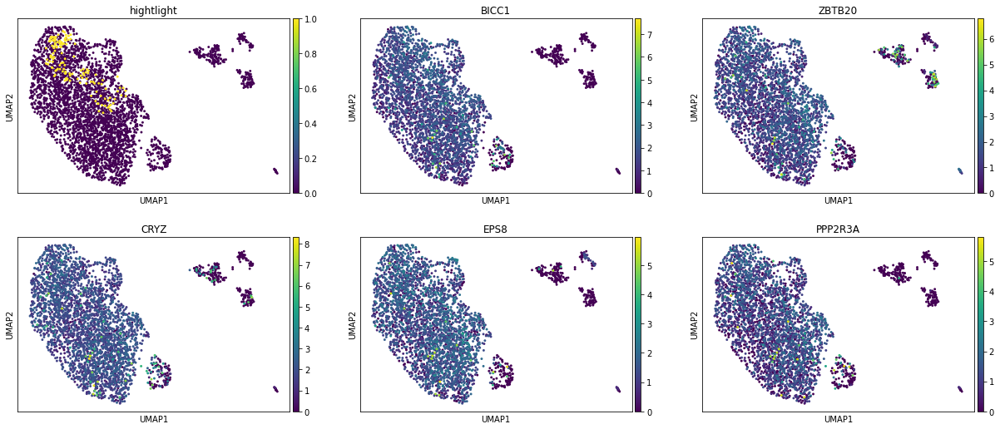

12


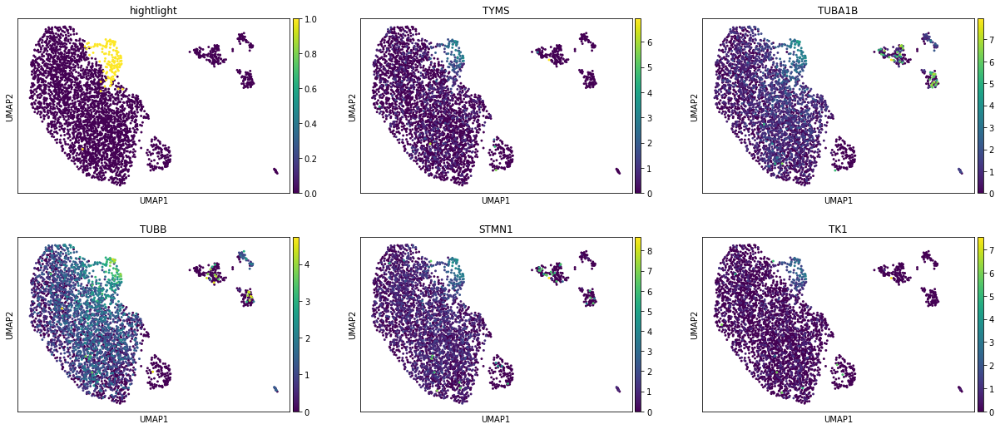

13


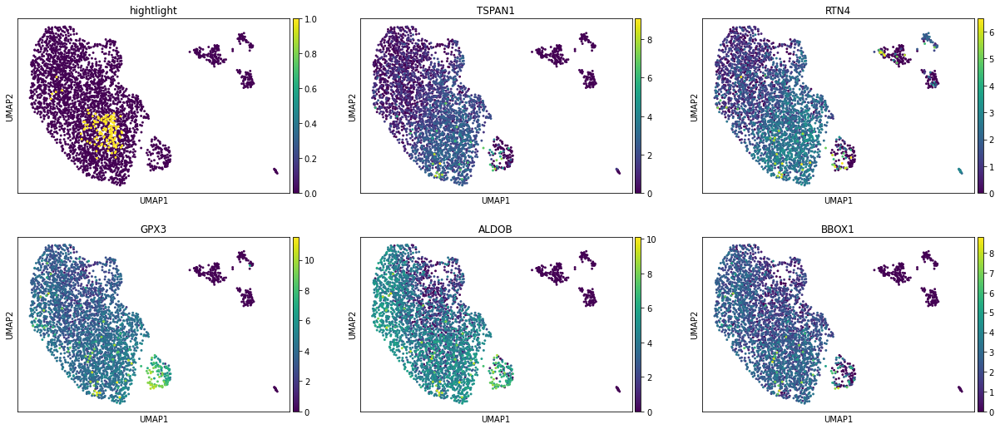

14


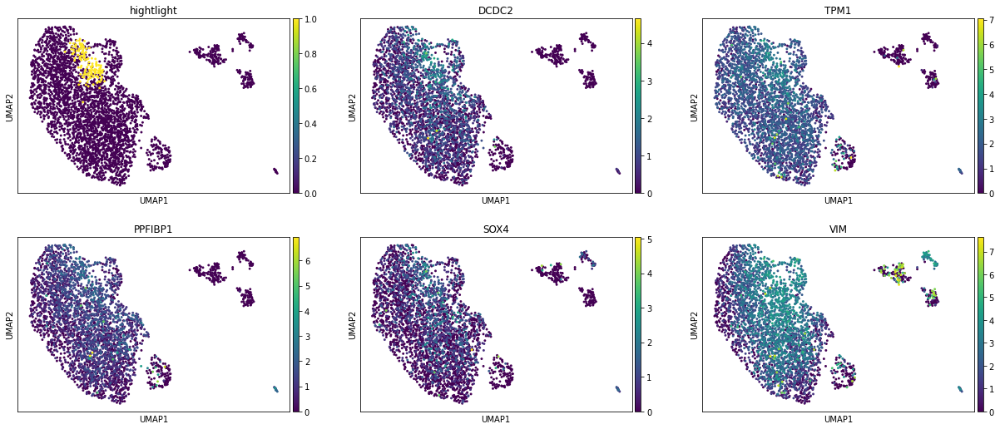

15


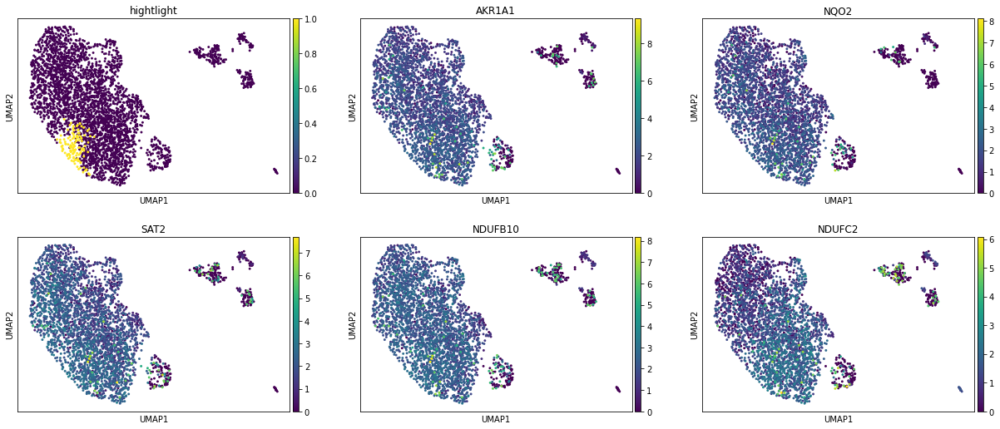

16


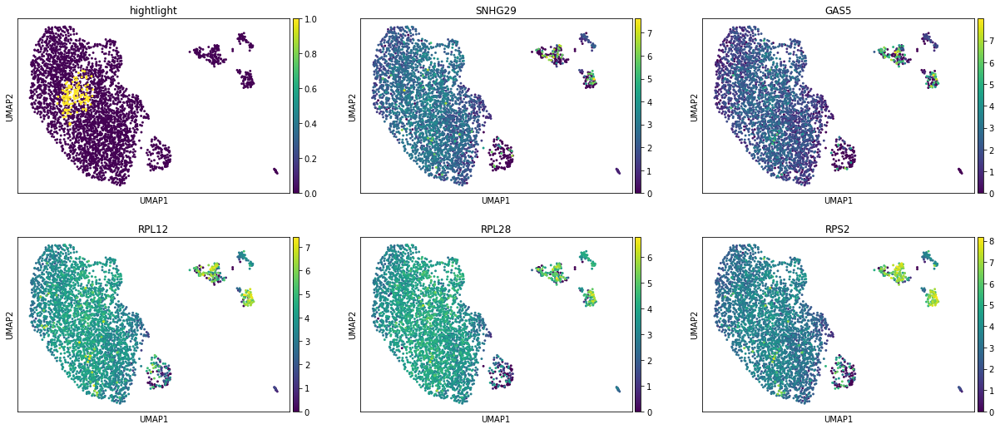

17


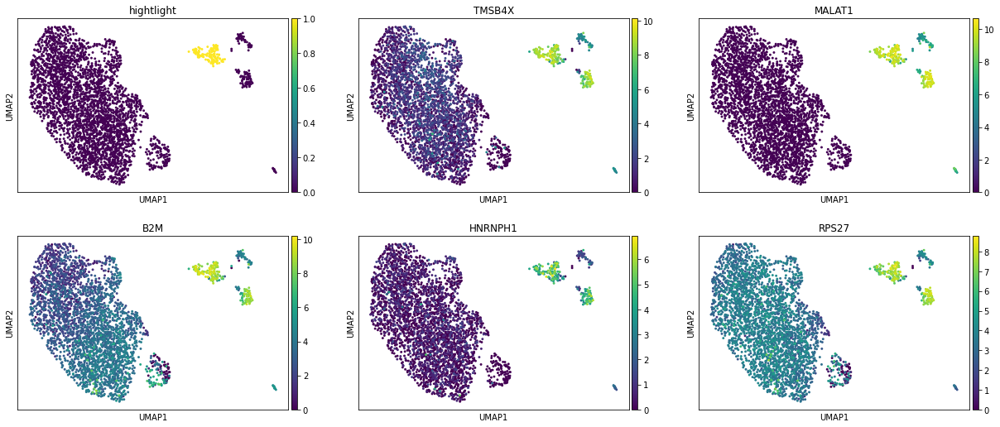

18


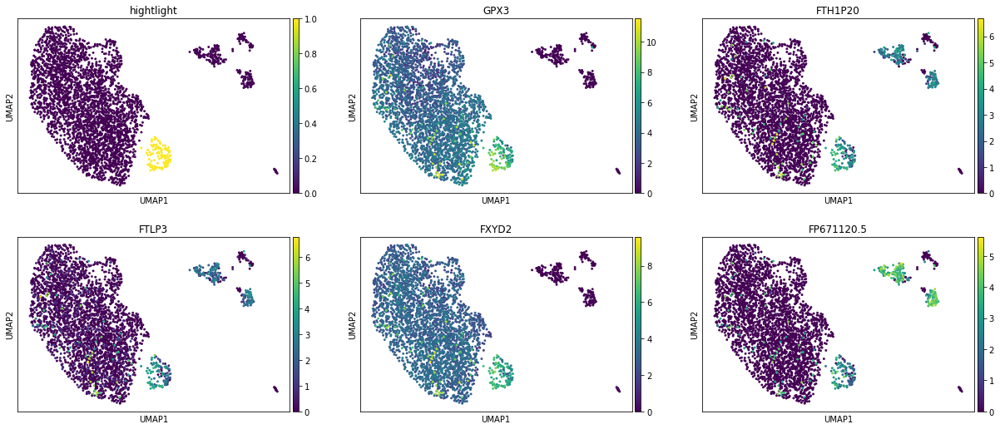

19


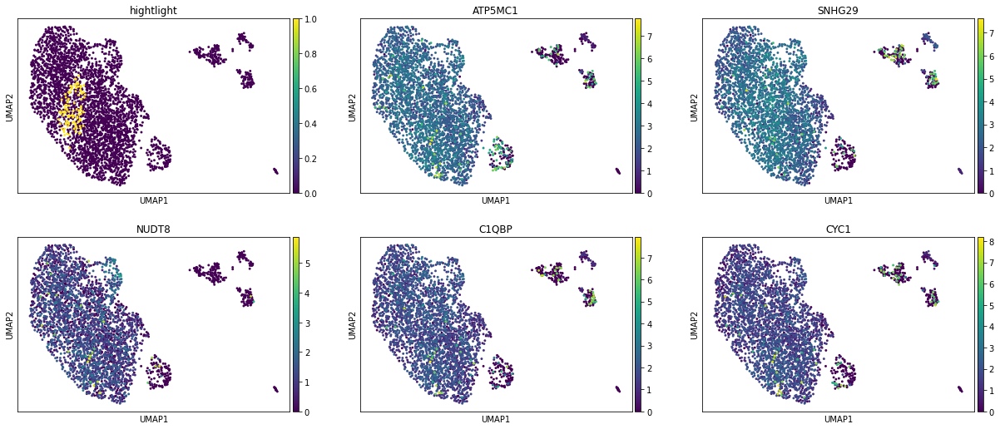

20


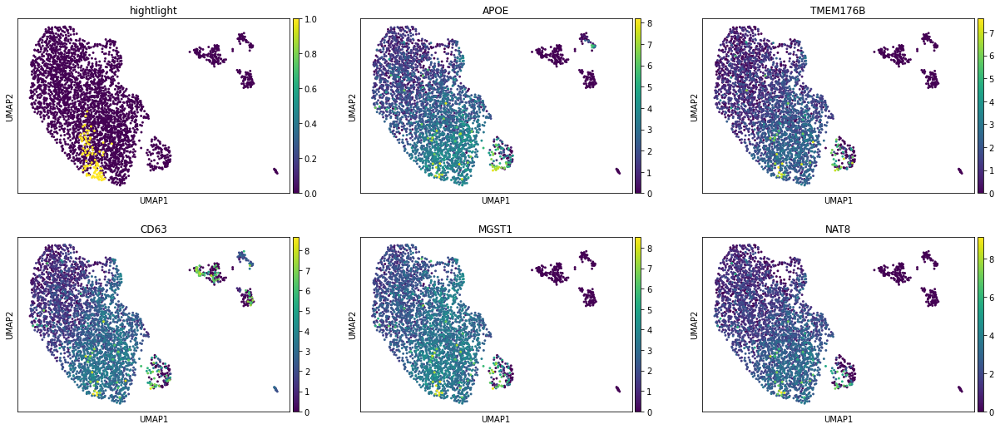

21


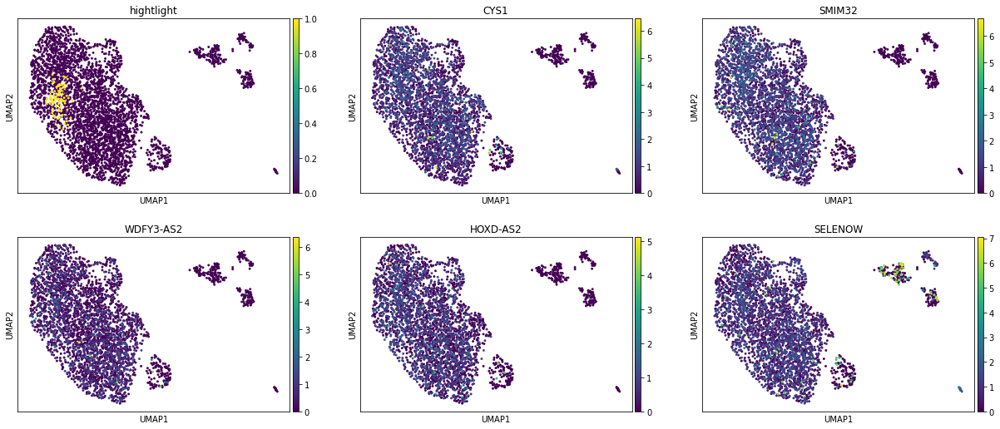

22


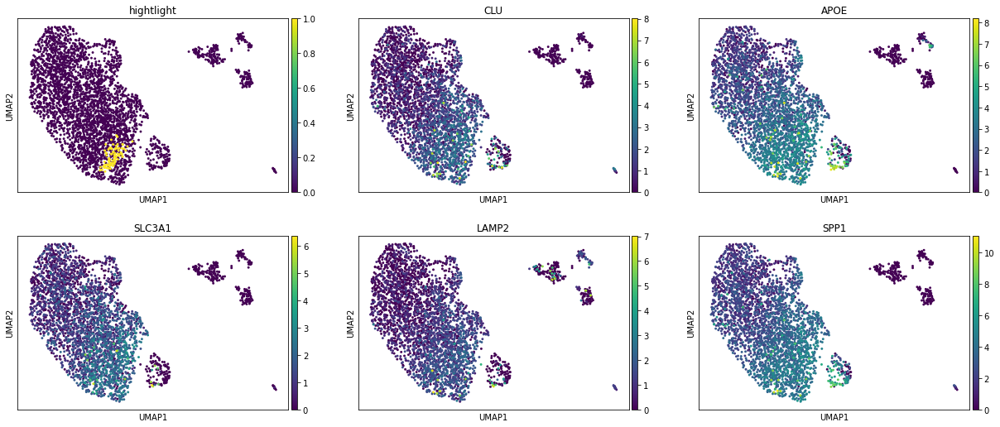

23


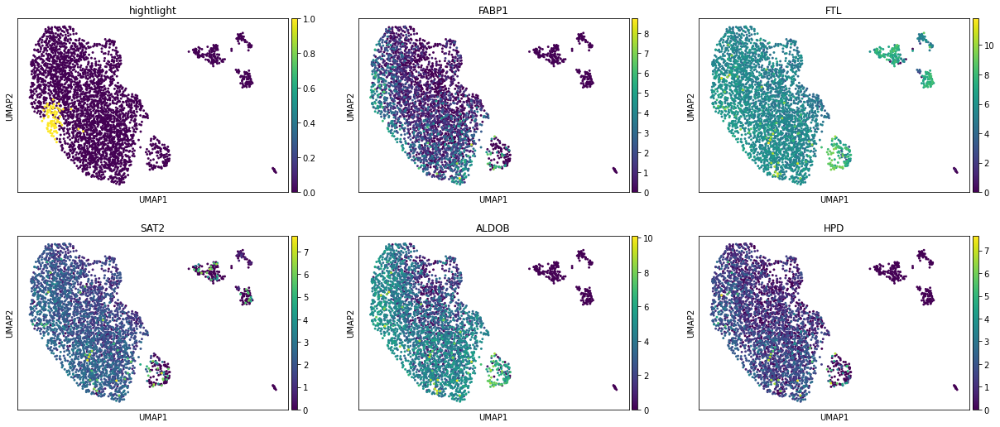

24


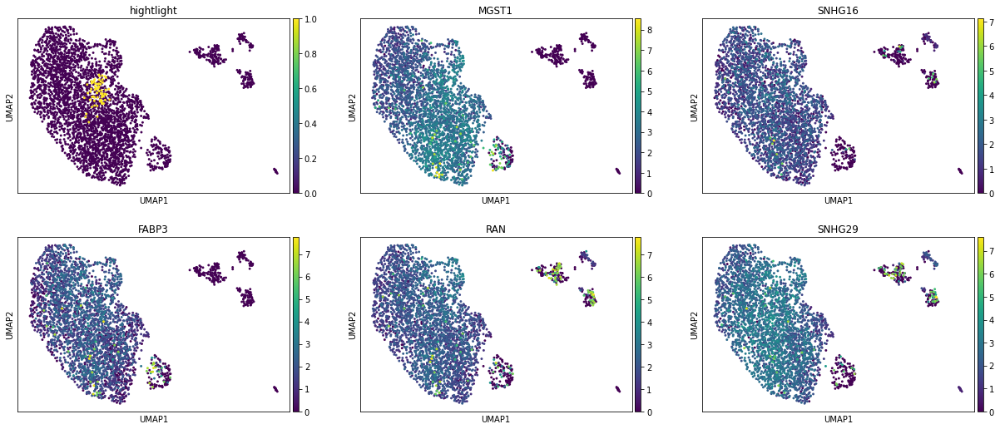

25


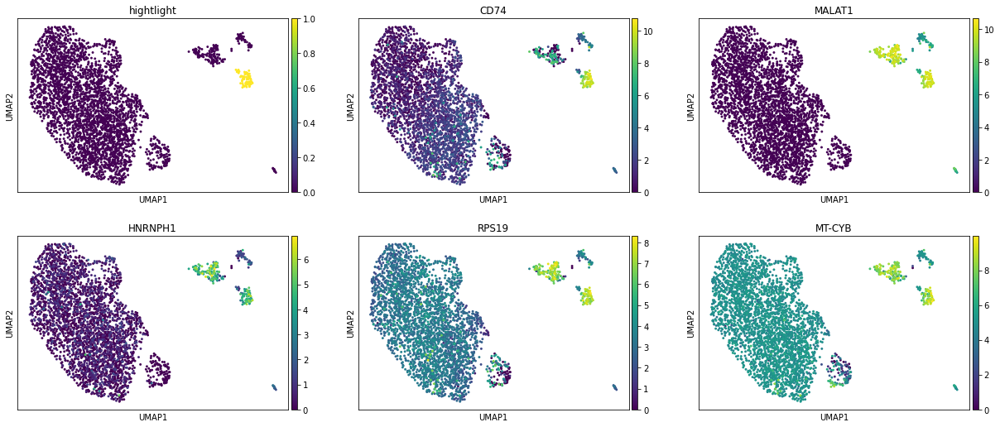

26


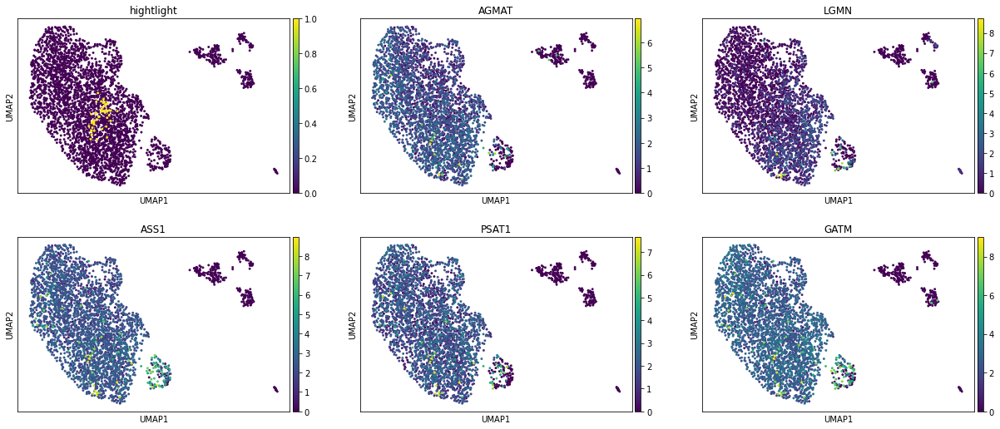

27


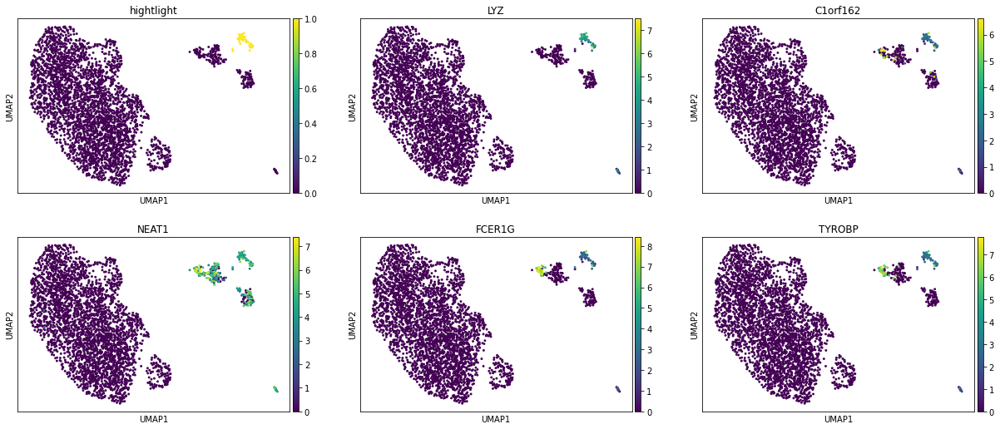

28


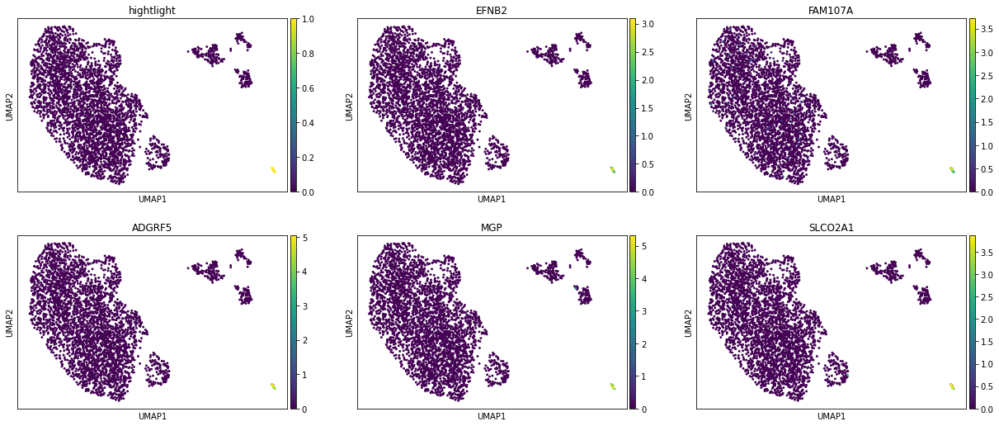

In [28]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [29]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
PCK1,14.633536,2.548445,5.051929e-44
FABP1,13.152105,2.825792,2.435778e-35
ALDOB,12.936282,2.420628,2.756069e-34
RNF152,10.716472,1.259923,3.134509e-23
ALDH6A1,10.243294,1.223989,2.765643e-21
...,...,...,...
ITM2B,-12.309459,-1.845161,5.928349e-31
CD63,-12.652076,-2.001998,9.163341e-33
CD24,-13.126300,-1.939984,2.740458e-35
CYBA,-13.831864,-2.785206,3.212764e-39


# read in cell ontology 

In [30]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [31]:
celltype_dict["T cell"]

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [32]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD24-positive, CD4 single-positive thymocyte',
 'CD4-positive, alpha-beta thymocyte',
 'CD4-positive, alpha-beta memory T cell',
 'effector memory CD4-positive, alpha-beta T cell',
 'activated CD4-positive type I NK T cell',
 'CD4-positive type I NK T cell secreting interleukin-4',
 'CD69-positive, CD4-positive single-positive thymocyte',
 'CD4-negative CD8-negative gamma-delta intraepithelial T cell',
 'CD4-negative, CD8-negative, alpha-beta intraepithelial T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interferon-gamma',
 'CD4-negative, CD8-negative type I NK T cell',
 'CD2-positive, CD5-positive, CD44-positive alpha-beta intraepithelial T cell',
 'activated CD4-positive, alpha-beta T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interleukin-4',
 'activated CD4-positive, alpha-beta T cell, human',
 'CD4-positive, CD25-positive, alpha-beta regulatory T cell',
 'activated CD4-negative, CD8-negative type I NK T cell',
 'CD4-positive, CD25-positive, C

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [33]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,-1.624755,-0.587523,-0.471469,-4.037303
log fold change,-28.910952,-27.240910,-26.970064,-0.411434
adjusted pvalue,1.000000,1.000000,1.000000,0.004290


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



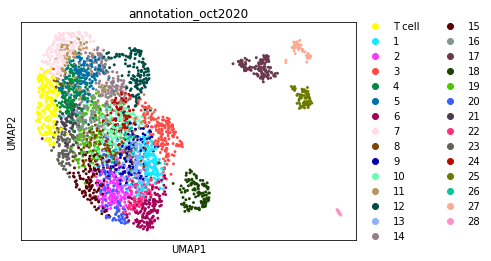

In [35]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# create celltype subcluster
This is just an example once the celltype annotations are done, how to subcluster cells in a celltype

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



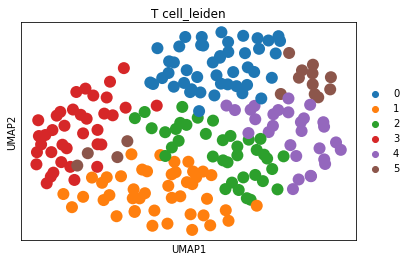

In [36]:
celltype = "T cell"
sub_organ_adata = organ_adata[organ_adata.obs["annotation_oct2020"] == celltype]
sc.pp.neighbors(sub_organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(
    sub_organ_adata,
)
sc.tl.leiden(sub_organ_adata, resolution=1, key_added="%s_leiden" % celltype)
sc.pl.umap(
    sub_organ_adata,
    color=["%s_leiden" % celltype],
    ncols=3,
)

In [37]:
sc.tl.rank_genes_groups(
    sub_organ_adata, groupby="%s_leiden" % celltype, method="wilcoxon"
)
sub_DE = FormatDE(sub_organ_adata.uns["rank_genes_groups"])

0


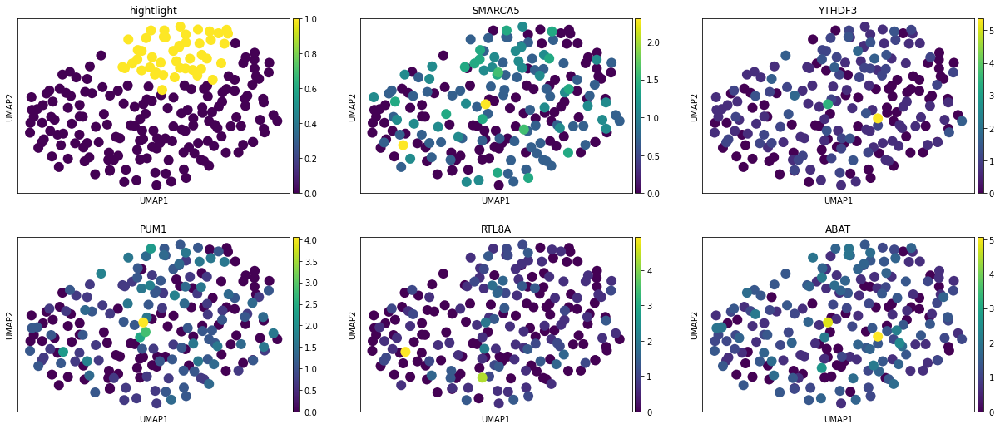

1


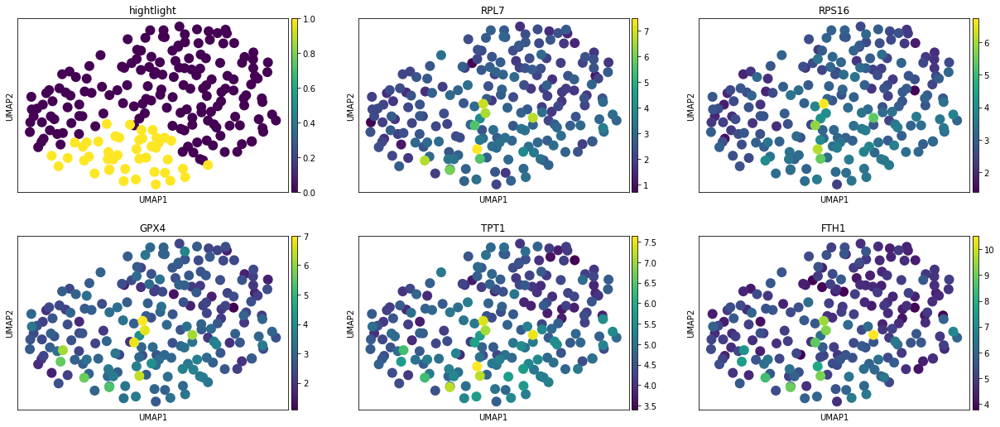

2


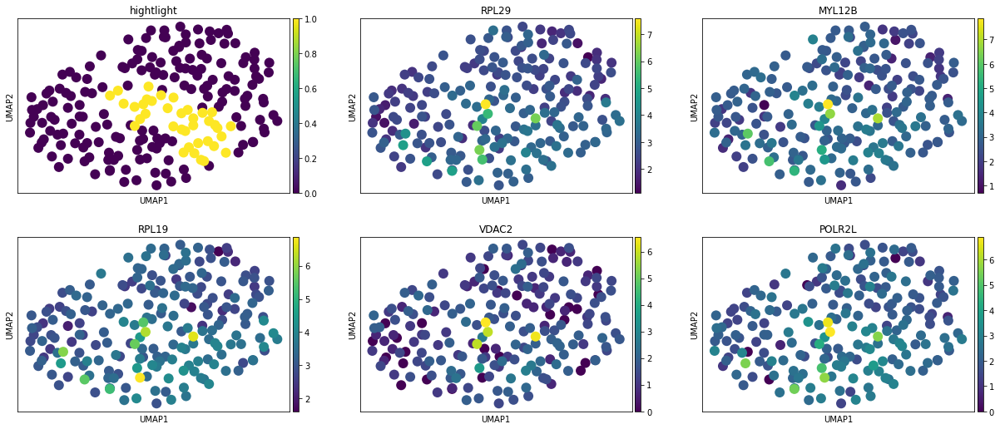

3


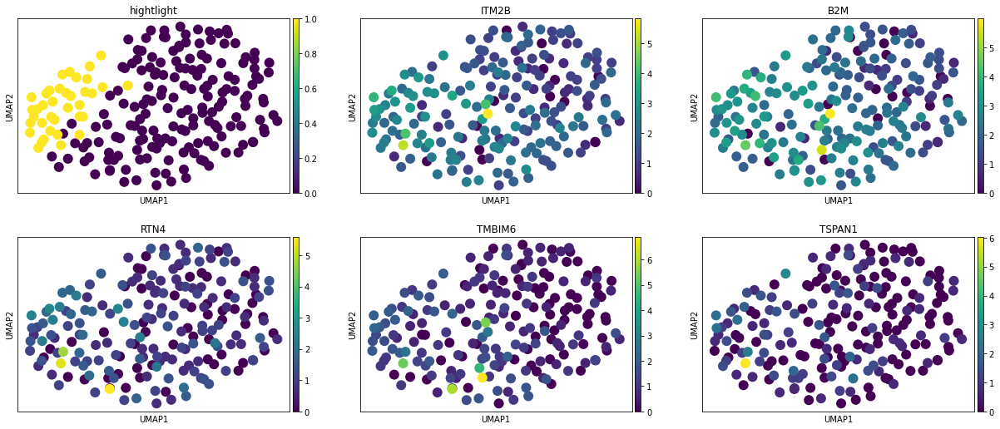

4


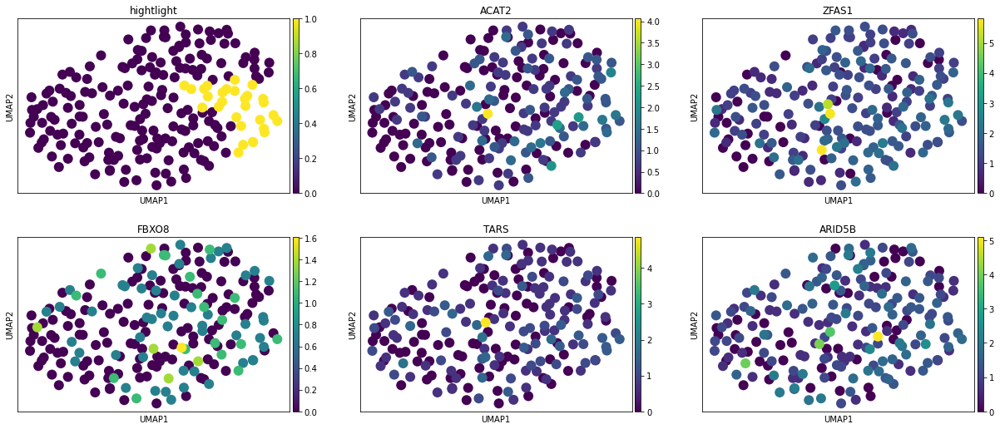

5


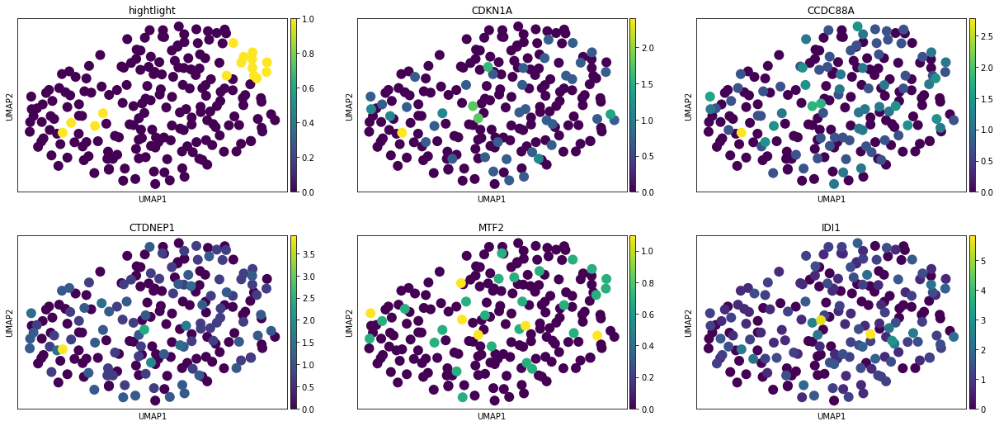

In [38]:
for x in sub_DE.keys():
    print(x)
    topgenes = list(sub_DE[x].T[:5].index)
    sub_organ_adata.obs["hightlight"] = sub_organ_adata.obs["%s_leiden" % celltype] == x
    sc.pl.umap(
        sub_organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

# manually create mapping between cell type and compartment (this is just an example)

In [39]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [40]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

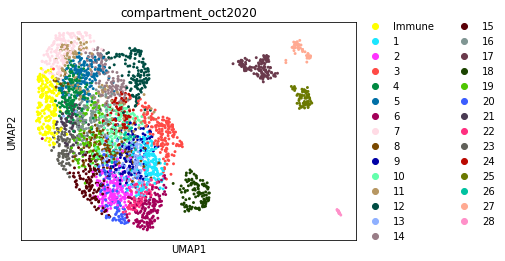

In [41]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [42]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)